## Bus Network (Delhi,2016) code


In [70]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import itertools
import collections
import csv
import networkx as nx
import networkx.algorithms.community as nx_comm

In [71]:

# Load the edge list from a CSV file
df = pd.read_csv("dbn.csv")

# Create an empty dictionary to store the undirected edges
undirected_edges = {}

# Iterate over each row in the edge list
for index, row in df.iterrows():

    # Extract the source and target nodes
    source = row['Source']
    target = row['Target']

    # Check if the edge is already in the undirected_edges dictionary
    #if (target, source) in undirected_edges:
        # If it is, increment the weight of the edge
     #   undirected_edges[(target, source)] += 1
    if (source, target) in undirected_edges:
        undirected_edges[(source, target)] += 1
    else:
        # If it's not, add the edge to the dictionary with a weight of 1
        undirected_edges[(source, target)] = 1

# Convert the undirected_edges dictionary to a DataFrame
undirected_df = pd.DataFrame(undirected_edges.items(), columns=['Edge', 'Weight'])

# Split the Edge column into two separate columns for the source and target nodes
undirected_df[['Source', 'Target']] = pd.DataFrame(undirected_df['Edge'].tolist(), index=undirected_df.index)


In [72]:
undirected_df.head()

,Edge,Weight,Source,Target
0,"(Kendriya Terminal, Dr RML Hospital)",1,Kendriya Terminal,Dr RML Hospital
1,"(Kendriya Terminal, NDPO)",1,Kendriya Terminal,NDPO
2,"(Kendriya Terminal, Regal Cinema)",1,Kendriya Terminal,Regal Cinema
3,"(Kendriya Terminal, Upper Ridge Road)",1,Kendriya Terminal,Upper Ridge Road
4,"(Kendriya Terminal, Railway Colony)",1,Kendriya Terminal,Railway Colony


In [73]:
df = pd.read_csv("dbn.csv")
df = df.drop(columns = ["Weight"])

dict_undirected = {}

for index, row in undirected_df.iterrows():
    a = row['Source']
    b = row['Target']
    if a not in dict_undirected:
        dict_undirected[a]  = 1
    elif b not in dict_undirected:
        dict_undirected[b] = 1
    else:
        pass

In [74]:
# Wrong adj matrix generated from the method below, refer from_pandas_edgelist
adj_matrix = pd.crosstab(undirected_df['Source'], undirected_df['Target'])
nodes_list = sorted(list(set(adj_matrix.columns).union(set(adj_matrix.index))))
adj_matrix = adj_matrix.reindex(index=nodes_list, columns=nodes_list, fill_value=0)
adj_matrix.index.name = 'Nodes'
pd.DataFrame(adj_matrix).to_csv('adjacency_matrix.csv')

In [75]:
len(dict_undirected)

1554

In [76]:
G = nx.from_pandas_edgelist(undirected_df,'Source','Target')

In [77]:
nodes = []

In [78]:
for i in G.nodes():
    nodes.append(i)

In [81]:
pd.DataFrame(nodes).to_csv('nodes.csv')

In [80]:
dict(G.nodes())

{'Kendriya Terminal': {},
 'Dr RML Hospital': {},
 'NDPO': {},
 'Regal Cinema': {},
 'Upper Ridge Road': {},
 'Railway Colony': {},
 'L N  Tample': {},
 'Mandir Marg': {},
 'Palika Kendra': {},
 'Krishi Bhawan': {},
 'Ridge Road Xing': {},
 'Talkatora Garden': {},
 'Shadi Pur Depot': {},
 'Ridge Road': {},
 'Shankar Road': {},
 'Jantar Mantar': {},
 'Patel Chowk': {},
 'Vigyan Bhawan': {},
 'Central Secretariat': {},
 'Shivaji Stadium': {},
 'Chitra Gupta Road': {},
 'New Delhi Railway Station Gate  II': {},
 'Mandi House': {},
 'Super Bazar CP': {},
 'New Delhi Railway Station Gate  I': {},
 'Akashvani Bhawan': {},
 'A I R ': {},
 'Statesman': {},
 'Vivekanand Road': {},
 'Gole Market': {},
 'Pusa Road Petrol Pump': {},
 'Govt Press': {},
 'Raghubir Nagar F  Blk': {},
 'Meghdoot Bhawan': {},
 'Punchkuian Raod': {},
 'Pahar Ganj Police Station': {},
 'Faiz Road': {},
 'Karol Bagh Terminal': {},
 'DB Gupta Market': {},
 'Ajmeri Gate': {},
 'Karol Bagh': {},
 'Rani Jhansi Road   Id Gah  

In [12]:
adj_matrix = nx.adjacency_matrix(G)
# Get the node names
node_names = list(G.nodes())

# Print the adjacency matrix with node names
print(np.column_stack((node_names, adj_matrix.toarray())))

[['Kendriya Terminal' '0' '1' ... '0' '0' '0']
 ['Dr RML Hospital' '1' '0' ... '0' '0' '0']
 ['NDPO' '1' '1' ... '0' '0' '0']
 ...
 ['Rohini Sec  5' '0' '0' ... '0' '0' '0']
 ['Rohini Sec  23  24   Divider Road  ' '0' '0' ... '0' '0' '0']
 ['Nithari' '0' '0' ... '0' '0' '0']]


In [13]:
adj_matrix

<1554x1554 sparse matrix of type '<class 'numpy.intc'>'
	with 7217 stored elements in Compressed Sparse Row format>

In [14]:
print(adj_matrix.todense())

[[0 1 1 ... 0 0 0]
 [1 0 1 ... 0 0 0]
 [1 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [15]:
print(len(adj_matrix.todense()))
pd.DataFrame(adj_matrix.todense()).to_csv('adjacency_matrix.csv') #adjacency matrix saved

1554


In [16]:
adj_matrix = adj_matrix.todense()
det = np.linalg.det(adj_matrix)

# Print the determinant
print(f'The determinant of the adjacency matrix is {det}.')

# Compute the trace of the adjacency matrix
trace = np.trace(adj_matrix)

# Print the trace
print(f'The trace of the adjacency matrix is {trace}.')

The determinant of the adjacency matrix is 0.0.
The trace of the adjacency matrix is 17.


In [17]:
pd.DataFrame(adj_matrix).to_csv('adjacency_matrix.csv')

In [18]:
# Get the list of nodes and write it to a CSV file
nodes = (list(set(undirected_df['Source']).union(set(undirected_df['Target']))))
pd.DataFrame(nodes, columns=['Nodes']).to_csv('nodes.csv', index=False)

In [19]:
# Compute all the eigenvalues of the adjacency matrix
eigenvalues = np.linalg.eigvals(adj_matrix)

# Find the largest eigenvalue
largest_eigenvalue = max(eigenvalues)

# Print the largest eigenvalue
print(f'The largest eigenvalue of the adjacency matrix is {largest_eigenvalue}.')

The largest eigenvalue of the adjacency matrix is (11.37634085391629+0j).


In [20]:
len(adj_matrix)

1554

In [21]:
print(len(nx.laplacian_matrix(G).toarray()))
laplacian_matrix = nx.laplacian_matrix(G).toarray()

1554


In [22]:
pd.DataFrame(laplacian_matrix).to_csv('laplacian_matrix.csv') #laplacian matrix saved

In [23]:
eigenvalues, eigenvectors = np.linalg.eig(laplacian_matrix)

# Save the eigenvalues and eigenvectors to CSV files
pd.DataFrame(eigenvalues.real, columns=['eigenvalue']).to_csv('eigenvalues_laplacian_matrix.csv', index=False, float_format='%.6f')
pd.DataFrame(eigenvectors.real, columns=[f'eigenvector_{i+1}' for i in range(len(eigenvectors))]).to_csv('eigenvectors_laplacian_matrix.csv', index=False, float_format='%.6f')

In [24]:
G = nx.Graph(adj_matrix, nodetype=int)
G.edges()

EdgeView([(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 15), (0, 19), (0, 25), (0, 26), (0, 113), (0, 119), (0, 124), (0, 125), (0, 162), (0, 224), (0, 299), (0, 378), (0, 498), (0, 500), (0, 571), (0, 573), (0, 601), (0, 607), (0, 610), (0, 691), (0, 708), (0, 711), (0, 724), (0, 731), (0, 748), (0, 863), (0, 926), (0, 934), (0, 945), (0, 973), (0, 1019), (0, 1023), (0, 1136), (0, 1165), (0, 1189), (0, 1391), (0, 1395), (0, 1474), (0, 1477), (0, 1492), (0, 1513), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 9), (1, 10), (1, 11), (1, 12), (1, 13), (1, 14), (2, 3), (2, 8), (2, 9), (2, 15), (2, 16), (2, 17), (2, 18), (2, 19), (2, 504), (2, 1154), (3, 8), (3, 9), (3, 16), (3, 19), (3, 20), (3, 21), (3, 22), (3, 23), (3, 24), (3, 25), (3, 26), (3, 334), (4, 16), (4, 228), (4, 229), (4, 704), (5, 302), (5, 303), (5, 1157), (5, 1388), (6, 7), (6, 29), (6, 125), (6, 633), (7, 19), (7, 29), (7, 30), (7, 33), (7, 37), (7, 44), (7, 230), (7, 231), (

In [25]:
print(nx.info(G))

Graph with 1554 nodes and 3617 edges


In [29]:
list(nx.find_cycle(G))

[(0, 1), (1, 2), (2, 0)]

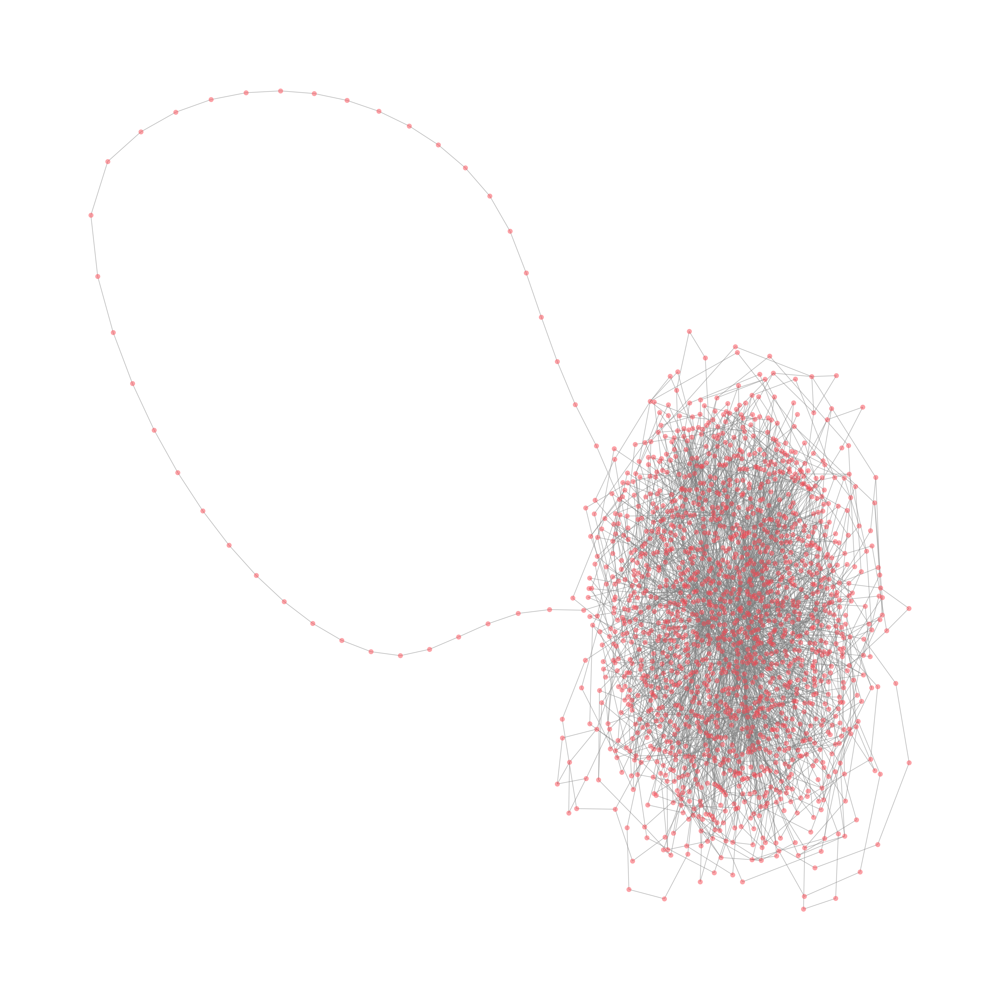

In [31]:
fig = plt.figure(figsize=(20, 20), dpi=300)

# Compute the positions of the nodes
pos = nx.kamada_kawai_layout(G)
# Draw the nodes and edges
nx.draw(G, pos, node_size=50, alpha=0.5, edge_color='gray', linewidths=0.1, node_color='#FA4651')

# Remove axis and adjust margins
plt.axis('off')
plt.subplots_adjust(left=0, bottom=0, right=1, top=1)

# Save the plot to a file
plt.savefig("bus_network_graph.png", dpi=300)
plt.show()

In [32]:
# Compute the degree of each node
degrees = dict(G.degree())

# Save the degree of each node to a CSV file
pd.DataFrame.from_dict(degrees, orient='index', columns=['degree']).to_csv('node_degrees.csv', index_label='node')

# Compute various centrality measures for the nodes
betweenness = nx.betweenness_centrality(G)
closeness = nx.closeness_centrality(G)
eigenvector = nx.eigenvector_centrality_numpy(G)
subgraph = nx.subgraph_centrality(G)

# Save the centrality measures to CSV files
pd.DataFrame.from_dict(betweenness, orient='index', columns=['betweenness']).to_csv('node_betweenness.csv', index_label='node')
pd.DataFrame.from_dict(closeness, orient='index', columns=['closeness']).to_csv('node_closeness.csv', index_label='node')
pd.DataFrame.from_dict(eigenvector, orient='index', columns=['eigenvector']).to_csv('node_eigenvector.csv', index_label='node')
pd.DataFrame.from_dict(subgraph, orient='index', columns=['subgraph']).to_csv('node_subgraph.csv', index_label='node')


In [33]:
# Compute various global network metrics
eccentricity = nx.eccentricity(G)
triangles = nx.triangles(G)

pd.DataFrame.from_dict(eccentricity, orient='index', columns=['eccentricity']).to_csv('node_eccentricity.csv', index_label='node')
pd.DataFrame.from_dict(triangles, orient='index', columns=['triangles']).to_csv('triangles.csv', index_label='node')



In [34]:
print(float(sum(nx.triangles(G).values()) / 3))
            
# divide by 3 to avoid overcounting

1102.0


In [35]:
print(nx.radius(G))

23


In [36]:
print(nx.diameter(G))


29


In [37]:
print(nx.average_clustering(G))

0.18331867201546365


In [38]:
print(nx.average_shortest_path_length(G))

5.53618561989457


In [39]:
print(nx.transitivity(G))

0.12187569121875691


In [40]:
print(nx.degree_assortativity_coefficient(G))

0.07127631885765942


In [41]:
def edge_to_remove(graph):
 G_dict = nx.edge_betweenness_centrality(graph)
 edge = ()

 # extract the edge with highest edge betweenness centrality score
 for key, value in sorted(G_dict.items(), key=lambda item: item[1], reverse = True):
     edge = key
     break

 return edge

In [42]:
def girvan_newman(graph):
    # find number of connected components
    sg = nx.connected_components(graph)
    sg_count = nx.number_connected_components(graph)

    while(sg_count == 1):
        graph.remove_edge(edge_to_remove(graph)[0], edge_to_remove(graph)[1])
        sg = nx.connected_components(graph)
        sg_count = nx.number_connected_components(graph)

    return sg

In [43]:
# Load the adjacency matrix from a CSV file
adj_matrix = pd.read_csv('adjacency_matrix.csv', index_col=0)

# Convert the DataFrame to a NumPy array
adj_matrix = adj_matrix.values

# Create a graph from the adjacency matrix
graph = nx.from_numpy_matrix(adj_matrix)

# Find the number of connected components
num_components = nx.number_connected_components(graph)

print(f'The adjacency matrix has {num_components} connected component(s).')

The adjacency matrix has 1 connected component(s).


In [44]:
# find communities in the graph
c = girvan_newman(G.copy())

# find the nodes forming the communities
node_groups = []

for i in c:
  node_groups.append(list(i))
node_groups


[[0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  109,
  110,
  111,
  112,
  113,
  114,
  115,
  116,
  117,
  118,
  119,
  120,
  121,
  122,
  123,
  124,
  125,
  126,
  127,
  128,
  129,
  130,
  131,
  132,
  133,
  134,
  135,
  136,
  137,
  138,
  139,
  140,
  141,
  142,
  143,
  144,
  145,
  146,
  147,
  148,
  149,
  150,
  151,
  152,
  153,
  154,
  155,
  156,
  157,
  15

In [45]:
len(node_groups)

2

In [46]:
data=pd.DataFrame(node_groups[0])
# data["1"] =node_groups[1]
data.to_csv("community_1.csv")

In [47]:
data=pd.DataFrame(node_groups[1])
# data["2"] =node_groups[2]
data.to_csv("community_2.csv")

In [48]:
# plot the communities
color_map = []
for node in G:
    if node in node_groups[0]:
        color_map.append('#FE5A5A')
    else: 
        color_map.append('#010DC2')  


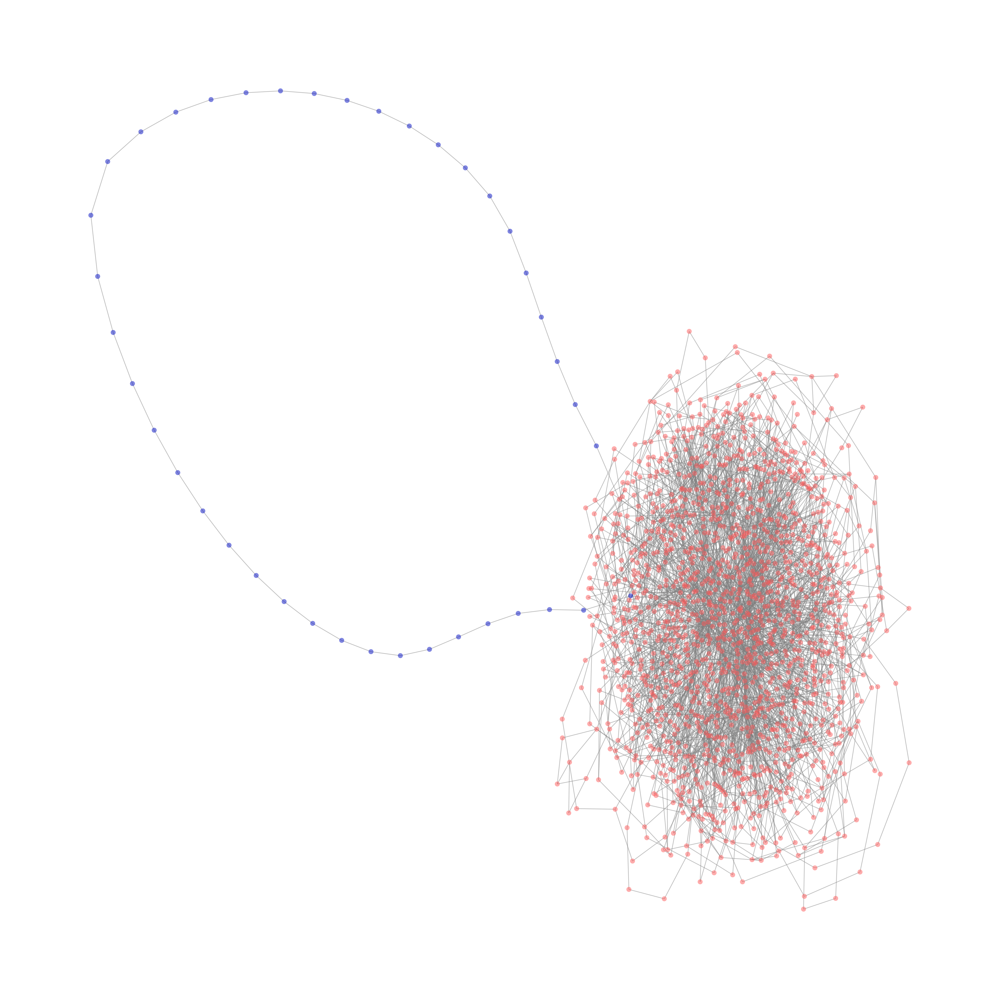

In [60]:
fig = plt.figure(figsize=(20, 20), dpi=300)

# Compute the positions of the nodes
pos = nx.kamada_kawai_layout(G)
# Draw the nodes and edges
nx.draw(G, pos, node_size=50, alpha=0.5, edge_color='grey', linewidths=0.1, node_color=color_map)

# Remove axis and adjust margins
plt.axis('off')
plt.subplots_adjust(left=0, bottom=0, right=1, top=1)

# Save the plot to a file
plt.savefig("bus_communities_graph.png", dpi=300)
plt.show()

In [61]:
print(nx_comm.modularity(G, node_groups))

0.02132023470098547


In [62]:
# Find the eigenvalues and eigenvectors of the adjacency matrix
eigenvalues, eigenvectors = np.linalg.eig(adj_matrix)

# Save the eigenvalues and eigenvectors to CSV files
pd.DataFrame(eigenvalues.real, columns=['eigenvalue']).to_csv('eigenvalues.csv', index=False, float_format='%.6f')
pd.DataFrame(eigenvectors.real, columns=[f'eigenvector_{i+1}' for i in range(len(eigenvectors))]).to_csv('eigenvectors.csv', index=False, float_format='%.6f')

In [63]:
adj_matrix = pd.read_csv('adjacency_matrix.csv', index_col=0)
distance_matrix = np.where(adj_matrix==1, 1, np.inf)

for k in range(distance_matrix.shape[0]):
    np.minimum(distance_matrix, distance_matrix[k,:] + distance_matrix[:,k].reshape(-1,1), out=distance_matrix)

print(distance_matrix)

[[2. 1. 1. ... 3. 4. 5.]
 [1. 2. 1. ... 4. 5. 6.]
 [1. 1. 2. ... 4. 5. 5.]
 ...
 [3. 4. 4. ... 2. 4. 6.]
 [4. 5. 5. ... 4. 2. 7.]
 [5. 6. 5. ... 6. 7. 2.]]


In [64]:
np.savetxt('distance_matrix.csv', distance_matrix, delimiter=',', fmt='%d')

In [65]:
# Calculate the incidence of the edges on the nodes
inc_mtx = nx.incidence_matrix(G)
print(inc_mtx.todense())

[[1. 1. 1. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 1. 0.]]


In [66]:
pd.DataFrame(inc_mtx.todense()).to_csv('incidence_matrix.csv') #incidence matrix

In [67]:
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components

# Convert the adjacency matrix to a CSR sparse matrix
sparse_matrix = csr_matrix(adj_matrix)

# Find the connected components in the network
num_partitions, partitions = connected_components(sparse_matrix)

# Print the number of partitions
print(f'The network has {num_partitions} partition(s).')

The network has 1 partition(s).


In [68]:
# Find the Katz centrality of the network and save it to a CSV file
alpha = 0.1
katz_centrality = nx.katz_centrality_numpy(G, alpha=alpha)
pd.DataFrame({'node': list(G.nodes()), 'katz_centrality': list(katz_centrality.values())}).to_csv('katz_centrality.csv', index=False)

In [69]:
# Find the number of cliques, spectral radius, and eigenvalue spacing for the adjacency matrix and save them to a CSV file
cliques = list(nx.find_cliques(G))
spectral_radius = max(abs(np.linalg.eigvals(adj_matrix)))
eigenvalues = sorted(abs(np.linalg.eigvals(adj_matrix)))
eigenvalue_spacing = min([eigenvalues[i+1]-eigenvalues[i] for i in range(len(eigenvalues)-1)])
pd.DataFrame({'num_cliques': [len(cliques)], 'spectral_radius': [spectral_radius], 'eigenvalue_spacing': [eigenvalue_spacing]}).to_csv('clique_spectral_eigenvalue.csv', index=False)


In [ ]:
0.17605914638103803
0.14756045369883275
0.1444648345631246
0.17056092516773672
0.1459141519622087
0.15072742957452478
0.15229617033840162
0.14436745597742956
0.14895560597892538
0.15531151933005527
0.15189459414993395
0.14575749341224029
0.14630036910878455
0.16417326083106434
0.1629159971341377
0.15843255197539494
0.15231392258215587
0.15687415027479304
0.15107068103705903
0.15081370929742327
0.1540300061949435
0.1540300061949435
0.15688798504249182
0.1478519164487567
0.14645360228955298
0.13846641438185195
0.14602535318398843
0.1447543509691964
0.14295671725981593
0.15241304225722554
0.15393109810333633
0.15233054653518863
0.15079796763006606
0.13983143163755227
0.1517782052036366
0.1381407481548491
0.15364806483612972
0.15016232173449465
0.148931115664442
0.15221886971624307
0.13694863282195666
0.13694863282195666
0.13865424087316394
0.15867081741260897